# Rockall Trough transport

In [1]:
%load_ext autoreload
%autoreload 2
import sys; sys.path.append(r'../') # Add this line at the beginner of each notebook to be able to load local functions 
%matplotlib inline
from matplotlib import pyplot as plt
import src.features.RT_functions as rtf
import src.features.RT_data as rtd
import src.set_paths as sps
import src.features.RT_EOF_functions as rt_eof
from src.RT_parameters import filter_length,corr_model,z_cutoff_EW,z_cutoff_WW,lon_cutoff_WW,NX_WW,NX_MB,NX_EW,SA_ref,CT_ref,rhoCp,rho0,Omega

In [2]:
import dask
import datetime
import gsw
import scipy
import scipy.io
import cmocean as cm
import numpy as np
import pandas as pd
import seawater as sw
import scipy.signal as signal
import palettable.colorbrewer as cb
import xarray as xr
from pathlib import Path
from scipy.signal import butter, filtfilt
from xhistogram.xarray import histogram as xhist

### Set in- and output path

In [3]:
date_str_start = '201407'
date_str_end = '202207'
fn_version = 'v0'
script_name = f"0.0_Rockall_Trough_moorings_data_prep_{date_str_start[:-2]}_{date_str_end[:-2]}_v0"

RT_mooring_fn = f'Rockall_Trough_mooring_gridded_TSUV_{date_str_start}_{date_str_end}_v0.nc'

# output figures
fig_out_path = (sps.local_fig_dir/f"{script_name}")
Path(fig_out_path).mkdir(parents=True, exist_ok=True)

In [4]:
# output data
data_out_path = (sps.local_data_dir/f"{script_name}")
Path(data_out_path).mkdir(parents=True, exist_ok=True)

fn_base = "Rockall_Trough_mooring_gridded_TSUV"
file_name_out = f"{fn_base}_{date_str_start}_{date_str_end}_v0.1.nc"

## Parameter Preamble

In [5]:
filter_length = 90     # (days)
corr_model = 0.0759    # Correction parameter (m/s) to adjust GLORYS DAC V component to the 8 month DAC from ADCP
z_cutoff_EW = 750     # Depth (m) where transition from GLORYS-ADCP data to CM data at Eastern wedge
z_cutoff_WW = 250     # Depth (m) limit of upper-left corner cutout
lon_cutoff_WW = -12.906  # Longitude limit of upper-left corner cutout
NX_WW = 100            # Horizontal grid size in Western wedge
NX_MB = 100           # Horizontal grid size in Mid-basin (needed for Ekman calc.)
NX_EW = 100            # Horizontal grid size in Eastern wedge
SA_ref = 35.34         # Reference Absolute Salinity (g/kg), for freshwater flux calc
CT_ref = 7.07          # Reference Conservative Temperature (C), for heat flux calc
rhoCp = 4.1e6         # Constant: Reference density times specific heat capacity (J m^-3 C^-1)   
rho0 = 1027            # Reference density          
Omega = 7.2921e-5     # Earth's rotation

## Load Data and prepare for calculations

In [6]:
# Rockall Trough mooring location
moor_ds=pd.read_csv(sps.raw_data_dir/sps.RT_loc_fn)
moor_ds = moor_ds.set_index(['ID']).to_xarray()

lon_RTWB1 = moor_ds.sel(ID='RTWB1').lon.values
lat_RTWB1 = moor_ds.sel(ID='RTWB1').lat.values
lon_RTWB2 = moor_ds.sel(ID='RTWB2').lon.values
lat_RTWB2 = moor_ds.sel(ID='RTWB2').lat.values
lon_RTWB = (lon_RTWB1 + lon_RTWB2)/2
lat_RTWB = (lat_RTWB1 + lat_RTWB2)/2
lon_RTEB = moor_ds.sel(ID='RTEB1').lon.values
lat_RTEB = moor_ds.sel(ID='RTEB1').lat.values
lon_RTADCP = moor_ds.sel(ID='RTADCP').lon.values
lat_RTADCP = moor_ds.sel(ID='RTADCP').lat.values
lon_RTWS = moor_ds.sel(ID='RTWS').lon.values
lat_RTWS = lat_RTWB
lon_RTES = moor_ds.sel(ID='RTES').lon.values
lat_RTES = lat_RTEB

In [7]:
df_cruises = pd.read_csv((sps.RT_data_path/'RT_mooring_cruises.csv'))
df_cruises['date start']= pd.to_datetime(df_cruises['date start'],format='%d/%m/%Y')
ds_cruises = df_cruises['cruise_id'].to_xarray()
ds_cruises.coords['TIME']=('index',df_cruises['date start'])
ds_cruises = ds_cruises.swap_dims({'index':'TIME'}).drop_vars('index')

In [8]:
# gridded Rockall Trough mooring data
gitpath = Path('C:/Users/sa07kb/Projects/m_moorproc_toolbox/data/moor/THREDDS')
ds_RT = xr.open_dataset((gitpath/'Rockall_Trough_mooring_gridded_TSUV_201407_202207_v0.nc'))

In [9]:
ds_RT_stacked = xr.open_dataset((gitpath/'Rockall_Trough_mooring_stacked_TSUV_201407_202207_v0.nc'))

In [10]:
# remove nan at beginning and end
ds_RT = ds_RT.where(ds_RT.TG_EAST.sel(PRES=500,method='nearest').notnull().drop_vars('PRES'),drop=True)

## Supplementary data

In [11]:
# tmin = str(ds_RT.TIME.min().values)[:-10]
# tmax = str(ds_RT.TIME.max().values)[:-10]

# ds_OSTIA_EB = rtd.get_OSTIA_sst('RTEB',tmin,tmax)
# ds_OSTIA_WB = rtd.get_OSTIA_sst('RTWB',tmin,tmax)

In [12]:
# ds_argo_EB = rtd.load_ARGO_RG_subset('RTEB',tmin,tmax)
# ds_argo_WB = rtd.load_ARGO_RG_subset('RTWB',tmin,tmax)

## Plot preprocess data

In [13]:
def plot_moored_obs(ds_RT,moor,var,ds_RT_stacked,savefig=False):
    fig,axs = plt.subplots(3,1,figsize=[16,8],sharex=True)

    if var=='velocity':
        if moor=='EB1':
            ax = axs[0]
            ds_RT.U_EAST.plot(ax=ax,x='TIME',yincrease=False,cmap=cm.cm.balance)
            ax = axs[1]
            ds_RT.V_EAST.plot(ax=ax,x='TIME',yincrease=False,cmap=cm.cm.balance)
            ax = axs[2]
            ds_RT.W_EAST.plot(ax=ax,x='TIME',yincrease=False,cmap=cm.cm.balance)
            for ax in axs:
                ds_RT_stacked.PS_EAST_1_UV.plot.line('k',ax=ax,x='TIME',hue='ZS_EAST_1_UV',add_legend=False,lw=0.5)

        elif moor=='WB1':
            ax = axs[0]
            ds_RT.U_WEST_1.plot(ax=ax,x='TIME',yincrease=False,cmap=cm.cm.balance)
            ax = axs[1]
            ds_RT.V_WEST_1.plot(ax=ax,x='TIME',yincrease=False,cmap=cm.cm.balance)
            ax = axs[2]
            ds_RT.W_WEST_1.plot(ax=ax,x='TIME',yincrease=False,cmap=cm.cm.balance)
            for ax in axs:
                ds_RT_stacked.PS_WEST_1_UV.plot.line('k',ax=ax,x='TIME',hue='ZS_WEST_1_UV',add_legend=False,lw=0.5)

        elif moor=='WB2':
            ax = axs[0]
            ds_RT.U_WEST_2.plot(ax=ax,x='TIME',yincrease=False,cmap=cm.cm.balance)
            ax = axs[1]
            ds_RT.V_WEST_2.plot(ax=ax,x='TIME',yincrease=False,cmap=cm.cm.balance)
            ax = axs[2]
            ds_RT.W_WEST_2.plot(ax=ax,x='TIME',yincrease=False,cmap=cm.cm.balance)
            for ax in axs:
                ds_RT_stacked.PS_WEST_2_UV.plot.line('k',ax=ax,x='TIME',hue='ZS_WEST_2_UV',add_legend=False,lw=0.5)
    
    elif var=='hydrography':
        if moor=='EB1':
            ax = axs[0]
            ds_RT.TG_EAST.plot(ax=ax,x='TIME',yincrease=False,cmap=cm.cm.thermal)
            ax = axs[1]
            ds_RT.SG_EAST.plot(ax=ax,x='TIME',yincrease=False,cmap=cm.cm.haline)
            ax = axs[2]
            sigma = gsw.sigma0(ds_RT.SG_EAST, ds_RT.TG_EAST)
            sigma.plot(ax=ax,x='TIME',yincrease=False,cmap=cm.cm.dense)
            for ax in axs:
                ds_RT_stacked.PS_EAST_TS.plot.line('k',ax=ax,x='TIME',hue='ZS_EAST_TS',add_legend=False,lw=0.5)
        elif moor=='WB1':
            ax = axs[0]
            ds_RT.TG_WEST.plot(ax=ax,x='TIME',yincrease=False,cmap=cm.cm.thermal)
            ax = axs[1]
            ds_RT.SG_WEST.plot(ax=ax,x='TIME',yincrease=False,cmap=cm.cm.haline)
            ax = axs[2]
            sigma = gsw.sigma0(ds_RT.SG_WEST, ds_RT.TG_WEST)
            sigma.plot(ax=ax,x='TIME',yincrease=False,cmap=cm.cm.dense)
            for ax in axs:
                ds_RT_stacked.PS_WEST_TS.plot.line('k',ax=ax,x='TIME',hue='ZS_WEST_TS',add_legend=False,lw=0.5)
        

    for ax in axs:
        ax.vlines(ds_cruises.TIME,0, 1,transform=ax.get_xaxis_transform(),color='k',linestyle='--')
        ax.set_xlabel('')
        ax.grid()

    for i,text in enumerate(ds_cruises):
        axs[0].annotate(text.values, xy=(ds_cruises[i].TIME,-5),va='bottom')

    plt.tight_layout()
    if savefig:
        fig.savefig((fig_out_path/f'RT_{moor}_{var}_{date_str_start[:-2]}_{date_str_end[:-2]}.png'),bbox_inches='tight')

# EB1

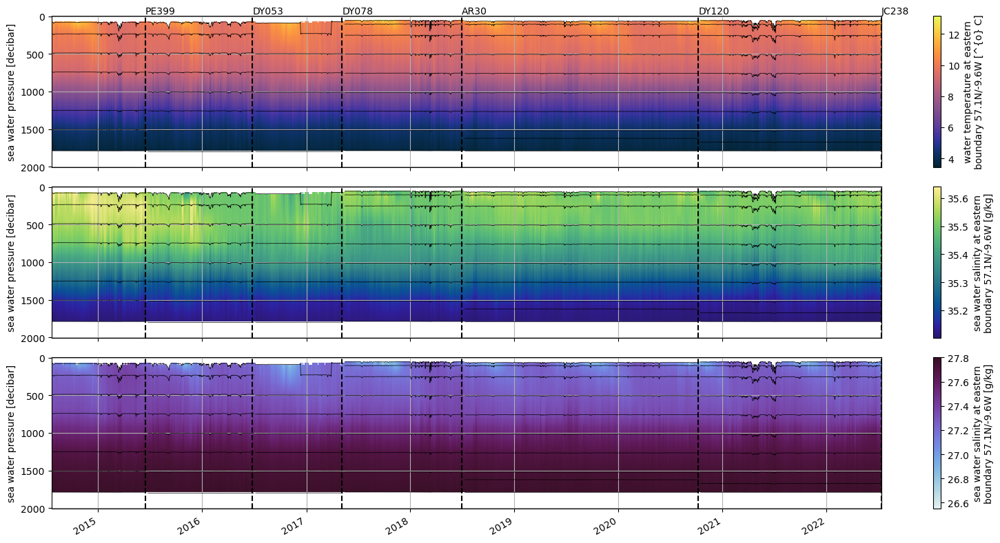

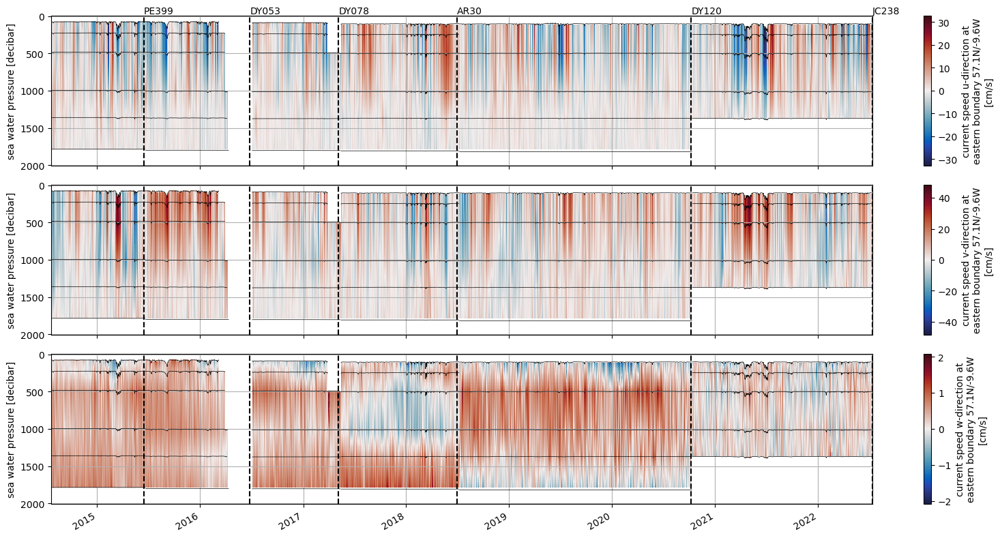

In [14]:
plot_moored_obs(ds_RT,'EB1','hydrography',ds_RT_stacked)
plot_moored_obs(ds_RT,'EB1','velocity',ds_RT_stacked)

# WB1

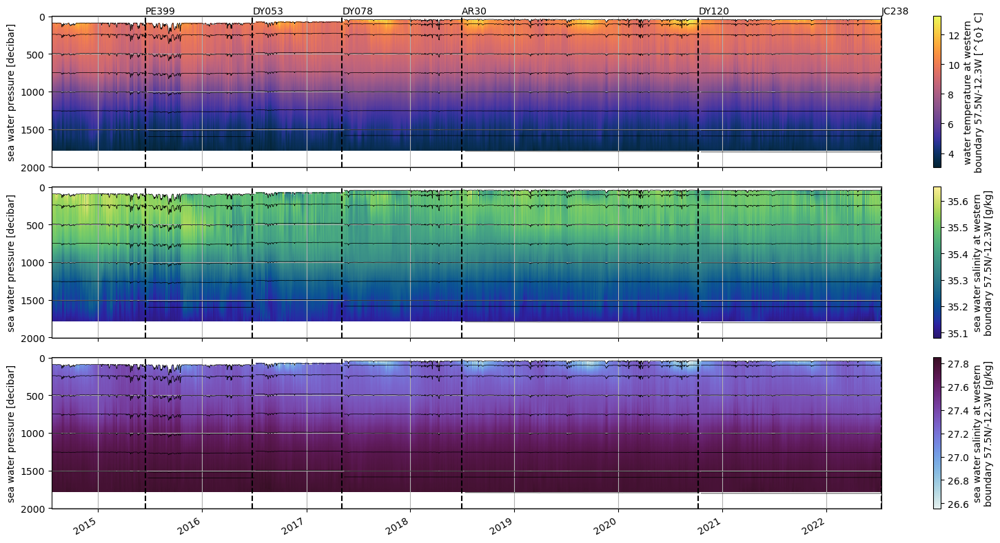

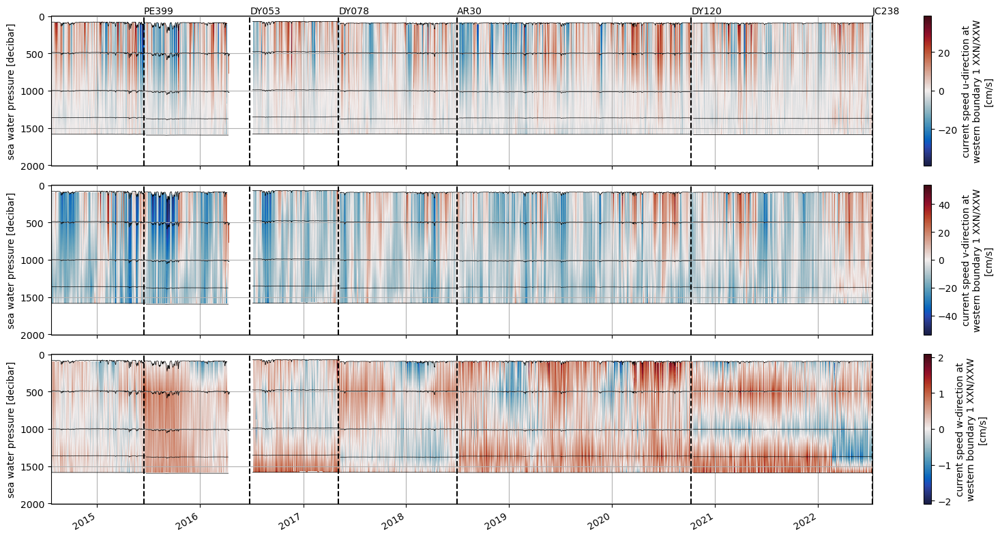

In [15]:
plot_moored_obs(ds_RT,'WB1','hydrography',ds_RT_stacked)
plot_moored_obs(ds_RT,'WB1','velocity',ds_RT_stacked)

# WB2

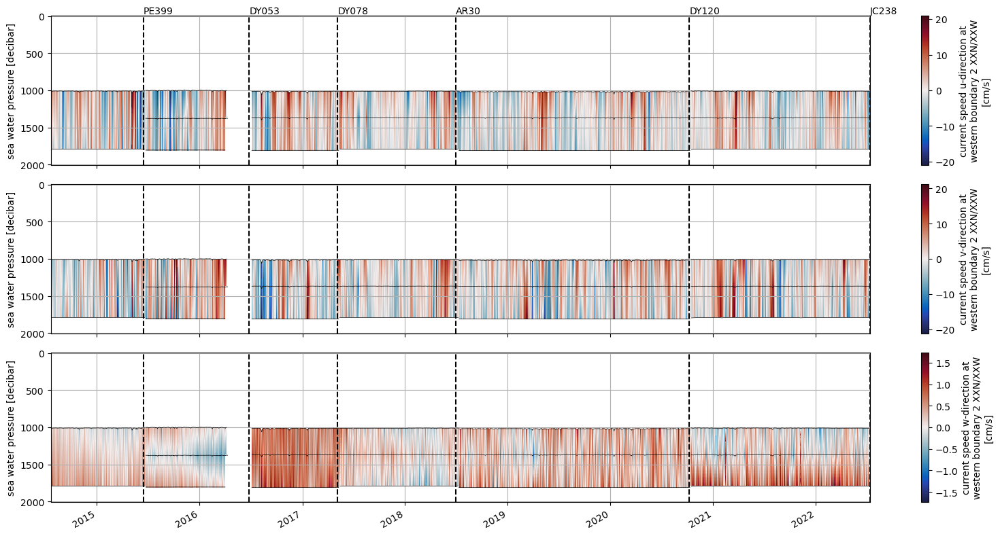

In [16]:
plot_moored_obs(ds_RT,'WB2','velocity',ds_RT_stacked)

## linear interpolation of upper values

In [17]:
def linear_upper_values_EAST(var):
    var_i = var.interpolate_na(
        dim='PRES',
        method="linear",
    )
    tlim = var_i.TIME.sel(TIME='2020-10-09T12:00:00',method='nearest')
    mask_2 = var_i.where((var_i.TIME>tlim)).notnull()
    mask_2 = mask_2 + var_i.where((var_i.TIME>tlim)).shift(PRES=-12).notnull()
    var_i = var.interpolate_na(
        dim='PRES',
        method="linear",
        fill_value="extrapolate",
    )
    mask_1 = var_i.where((var_i.PRES<=1780)&(var.TIME<=tlim)).notnull()
    mask = mask_1+mask_2

    var_i = var_i.where(mask)
    var_i = var_i.where(np.abs(var_i)<3.5*var_i.std(['TIME']))
    var_i = var_i.interpolate_na(
                dim='TIME',
                method="linear",
            ).where(mask)
    return var_i


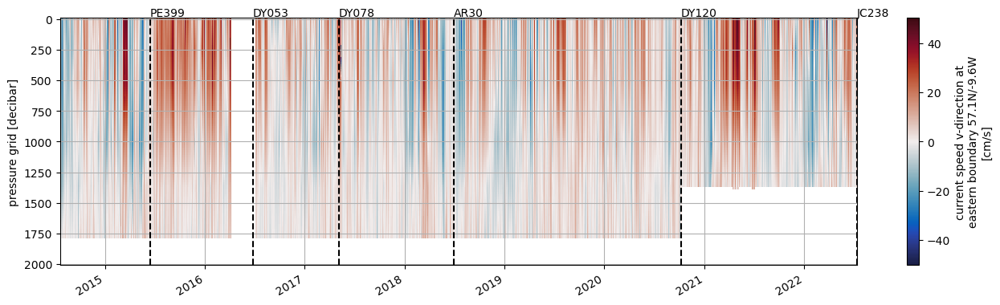

In [18]:
ds_RT['V_EAST'] = linear_upper_values_EAST(ds_RT.V_EAST)
ds_RT['U_EAST'] = linear_upper_values_EAST(ds_RT.U_EAST)
ds_RT['W_EAST'] = linear_upper_values_EAST(ds_RT.W_EAST)

V_EAST = ds_RT['V_EAST']

fig,axs = plt.subplots(1,1,figsize=[16,4],sharex=True)
ax = axs
(V_EAST).plot(ax=ax,x='TIME',yincrease=False,cmap=cm.cm.balance)

ax.vlines(ds_cruises.TIME,0, 1,transform=ax.get_xaxis_transform(),color='k',linestyle='--')
ax.set_xlabel('')
ax.grid()

for i,text in enumerate(ds_cruises):
    ax.annotate(text.values, xy=(ds_cruises[i].TIME,-5),va='bottom')

## extrapolation of 1350m values for 2021-2022 period

In [19]:
def lin_fit_quick(x,y):
    from sklearn.linear_model import LinearRegression
    x = x.values.reshape(-1, 1)
    y = y.values.reshape(-1, 1)
    model = LinearRegression().fit(x,y)
    r_sq = model.score(x, y)
    print(f"coefficient of determination: {r_sq}")
    print(f"intercept: {model.intercept_}")
    print(f"slope: {model.coef_}")
    return model

In [20]:
pmin = 1360
pmax = 1780
x = V_EAST.sel(PRES=pmin)
x=x-x.mean('TIME')
y = V_EAST.sel(PRES=pmax)
y = y-y.mean('TIME')

x = x.where(y.notnull(),drop=True)
y = y.where(y.notnull(),drop=True)

v_merge = xr.merge([x.rename('p1380m'),
                 y.rename('p1780m')])
v_merge['v_diff'] = v_merge.p1380m-v_merge.p1780m
v_merge['month'] = v_merge.TIME.dt.month

In [21]:
mod_15_17 = lin_fit_quick(x.sel(TIME=slice('2015','2017')),
            y.sel(TIME=slice('2015','2017')))

mod_17_19 = lin_fit_quick(x.sel(TIME=slice('2017','2019')),
            y.sel(TIME=slice('2017','2019')))

mod_19_21 = lin_fit_quick(x.sel(TIME=slice('2019','2021')),
            y.sel(TIME=slice('2019','2021')))

mod_20_22 = lin_fit_quick(x.sel(TIME=slice('2020',None)),
            y.sel(TIME=slice('2020',None)))

mod_14_22 = lin_fit_quick(x.sel(TIME=slice(None,None)),
            y.sel(TIME=slice(None,None)))

coefficient of determination: 0.4138006300904803
intercept: [-0.24275607]
slope: [[0.5474955]]
coefficient of determination: 0.5066912087778197
intercept: [0.00851157]
slope: [[0.668502]]
coefficient of determination: 0.44716521116381014
intercept: [-0.11810035]
slope: [[0.64244366]]
coefficient of determination: 0.3539372118584152
intercept: [0.05920412]
slope: [[0.5852799]]
coefficient of determination: 0.4213919516981859
intercept: [0.01309975]
slope: [[0.5705776]]


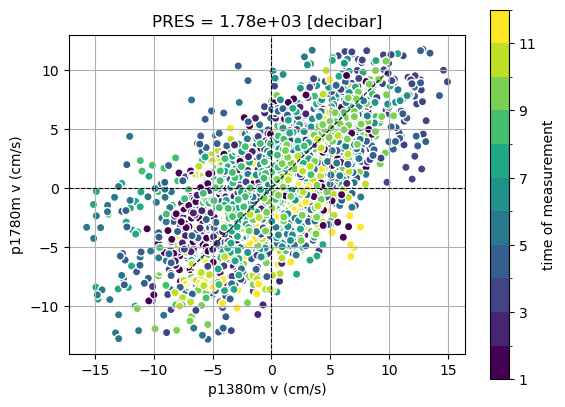

In [22]:
fig,axs=plt.subplots(1,1)
ax=axs

v_merge.plot.scatter(x='p1380m',y='p1780m',hue='month',
                    ax=ax,levels=12)
ax.plot(np.arange(-7,11),np.arange(-7,11),color='k',lw=0.8,ls='--')
# axs.legend(loc='upper center', bbox_to_anchor=(0.5, 1.2))
ax.set_ylabel('p1780m v (cm/s)')
ax.set_xlabel('p1380m v (cm/s)')
# ax.set_ylim([-.5,.5])
# ax.set_xlim([-.5,.5])
ax.set_aspect('equal', adjustable='box')
ax.grid()
ax.axvline(0,color='k',lw=0.8,ls='--')
ax.axhline(0,color='k',lw=0.8,ls='--')

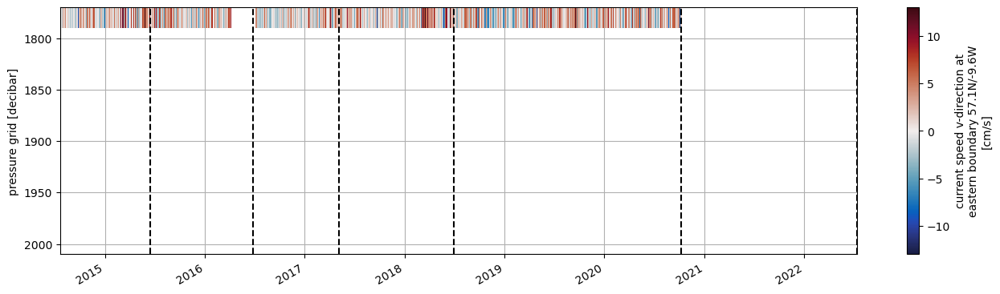

In [23]:
fig,axs = plt.subplots(1,1,figsize=[16,4],sharex=True)
ax = axs
(V_EAST).sel(PRES=slice(1780,None)).plot(ax=ax,x='TIME',yincrease=False,cmap=cm.cm.balance)

# ds_EB1.PRES.plot.line('k',ax=ax,x='TIME',hue='DEPTH',add_legend=False,lw=0.5)
ax.vlines(ds_cruises.TIME,0, 1,transform=ax.get_xaxis_transform(),color='k',linestyle='--')
ax.set_xlabel('')
ax.grid()

for i,text in enumerate(ds_cruises):
    ax.annotate(text.values, xy=(ds_cruises[i].TIME,-5),va='bottom')

In [24]:
def nearest_lower_values_EAST(var):
    var_i = var.interpolate_na(
            dim='PRES',
            method="nearest",
            fill_value="extrapolate",
        ).where((var.PRES<=1780))
    return var_i

ds_RT['V_EAST'] = nearest_lower_values_EAST(ds_RT.V_EAST)
ds_RT['U_EAST'] = nearest_lower_values_EAST(ds_RT.U_EAST)
ds_RT['W_EAST'] = nearest_lower_values_EAST(ds_RT.W_EAST)

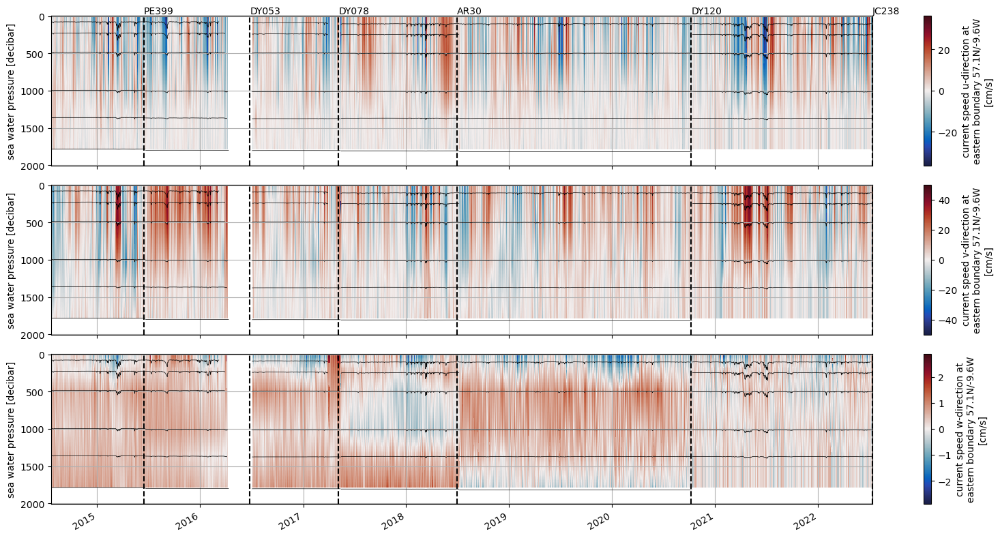

In [25]:
plot_moored_obs(ds_RT,'EB1','velocity',ds_RT_stacked)

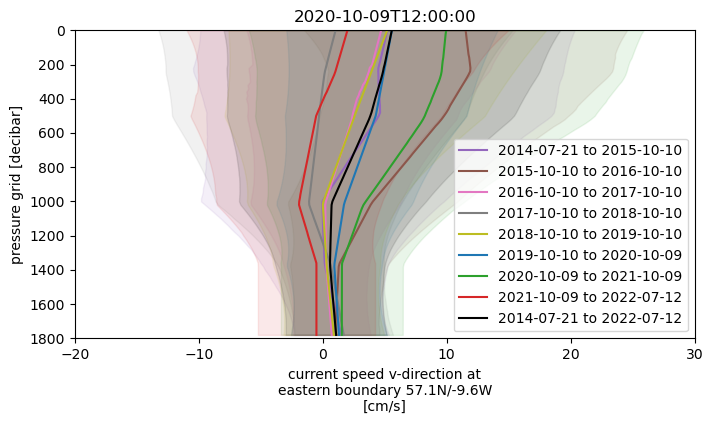

In [26]:
t='2020-10-09T12:00:00'
t1='2019-10-10T00:00:00'
t2='2021-10-09T00:00:00'
t3='2018-10-10T00:00:00'
t4='2017-10-10T00:00:00'
t5='2016-10-10T00:00:00'
t6='2015-10-10T00:00:00'

fig, ax = plt.subplots(figsize=(8, 4))
var = ds_RT['V_EAST']

dummy = var.sel(TIME=slice(None,t6)).mean('TIME',keep_attrs=True)
dummy2 = var.sel(TIME=slice(None,t6)).std('TIME',keep_attrs=True)
dummy.plot.line('C4',y='PRES',ax=ax,label=f'{var.TIME.min().values:.10s} to {t6:.10s}')
ax.fill_betweenx(dummy.PRES, dummy - dummy2, dummy + dummy2, color='C4', alpha=0.1)

dummy = var.sel(TIME=slice(t6,t5)).mean('TIME',keep_attrs=True)
dummy2 = var.sel(TIME=slice(t6,t5)).std('TIME',keep_attrs=True)
dummy.plot.line('C5',y='PRES',ax=ax,label=f'{t6:.10s} to {t5:.10s}')
ax.fill_betweenx(dummy.PRES, dummy - dummy2, dummy + dummy2, color='C5', alpha=0.1)

dummy = var.sel(TIME=slice(t5,t4)).mean('TIME',keep_attrs=True)
dummy2 = var.sel(TIME=slice(t5,t4)).std('TIME',keep_attrs=True)
dummy.plot.line('C6',y='PRES',ax=ax,label=f'{t5:.10s} to {t4:.10s}')
ax.fill_betweenx(dummy.PRES, dummy - dummy2, dummy + dummy2, color='C6', alpha=0.1)

dummy = var.sel(TIME=slice(t4,t3)).mean('TIME',keep_attrs=True)
dummy2 = var.sel(TIME=slice(t4,t3)).std('TIME',keep_attrs=True)
dummy.plot.line('C7',y='PRES',ax=ax,label=f'{t4:.10s} to {t3:.10s}')
ax.fill_betweenx(dummy.PRES, dummy - dummy2, dummy + dummy2, color='C7', alpha=0.1)

dummy = var.sel(TIME=slice(t3,t1)).mean('TIME',keep_attrs=True)
dummy2 = var.sel(TIME=slice(t3,t1)).std('TIME',keep_attrs=True)
dummy.plot.line('C8',y='PRES',ax=ax,label=f'{t3:.10s} to {t1:.10s}')
ax.fill_betweenx(dummy.PRES, dummy - dummy2, dummy + dummy2, color='C8', alpha=0.1)

dummy = var.sel(TIME=slice(t1,t)).mean('TIME',keep_attrs=True)
dummy2 = var.sel(TIME=slice(t1,t)).std('TIME',keep_attrs=True)
dummy.plot.line('C0',y='PRES',ax=ax,label=f'{t1:.10s} to {t:.10s}');
ax.fill_betweenx(dummy.PRES, dummy - dummy2, dummy + dummy2, color='C0', alpha=0.1)

dummy = var.sel(TIME=slice(t,t2)).mean('TIME',keep_attrs=True)
dummy2 = var.sel(TIME=slice(t,t2)).std('TIME',keep_attrs=True)
dummy.plot.line('C2',y='PRES',ax=ax,label=f'{t:.10s} to {t2:.10s}')
ax.fill_betweenx(dummy.PRES, dummy - dummy2, dummy + dummy2, color='C2', alpha=0.1)

dummy = var.sel(TIME=slice(t2,None)).mean('TIME',keep_attrs=True)
dummy2 = var.sel(TIME=slice(t2,None)).std('TIME',keep_attrs=True)
dummy.plot.line('C3',y='PRES',ax=ax,label=f'{t2:.10s} to {var.TIME.max().values:.10s}')
ax.fill_betweenx(dummy.PRES, dummy - dummy2, dummy + dummy2, color='C3', alpha=0.1)

dummy = var.mean('TIME',keep_attrs=True)
dummy2 = var.std('TIME',keep_attrs=True)
dummy.plot.line('k',y='PRES',ax=ax,label=f'{var.TIME.min().values:.10s} to {var.TIME.max().values:.10s}')
ax.fill_betweenx(dummy.PRES, dummy - dummy2, dummy + dummy2, color='k', alpha=0.1)

plt.title(t);
plt.ylim([1800,0]);
plt.xlim([-20, 30]);
plt.legend()

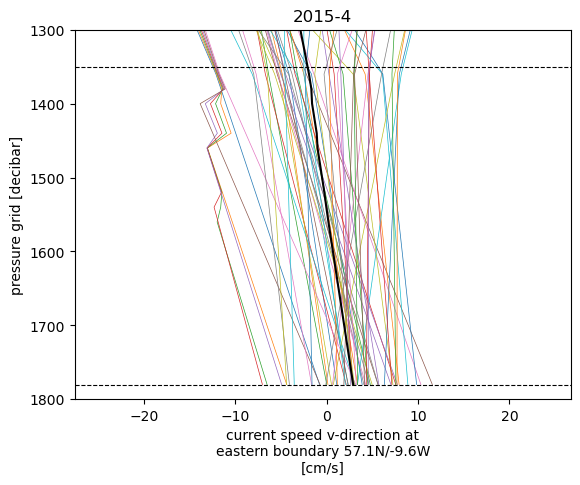

In [27]:
t='2015-4'
ds_RT.V_EAST.sel(TIME=t).plot(y='PRES',hue='TIME',ylim=[1800,1300],add_legend=False,lw=0.5);
ds_RT.V_EAST.sel(TIME=t).mean('TIME',keep_attrs=True).plot.line('k',y='PRES',ylim=[1800,1300],add_legend=False)
plt.axhline(1350,color='k',lw=0.8,ls='--')
plt.axhline(1780,color='k',lw=0.8,ls='--')
plt.title(t);

# remove spurious values and upper extraploation hygrography

In [28]:
def repeat_upper_values(var):
    mask = var.notnull()
    mask = mask + var.shift(PRES=-10).notnull()
    var = var.interpolate_na(
        dim='PRES',
        method="nearest",
        fill_value="extrapolate",
    ).where(mask)
    return var

In [29]:
ds_RT['TG_EAST'] = repeat_upper_values(ds_RT['TG_EAST'])
ds_RT['SG_EAST'] = repeat_upper_values(ds_RT['SG_EAST'])

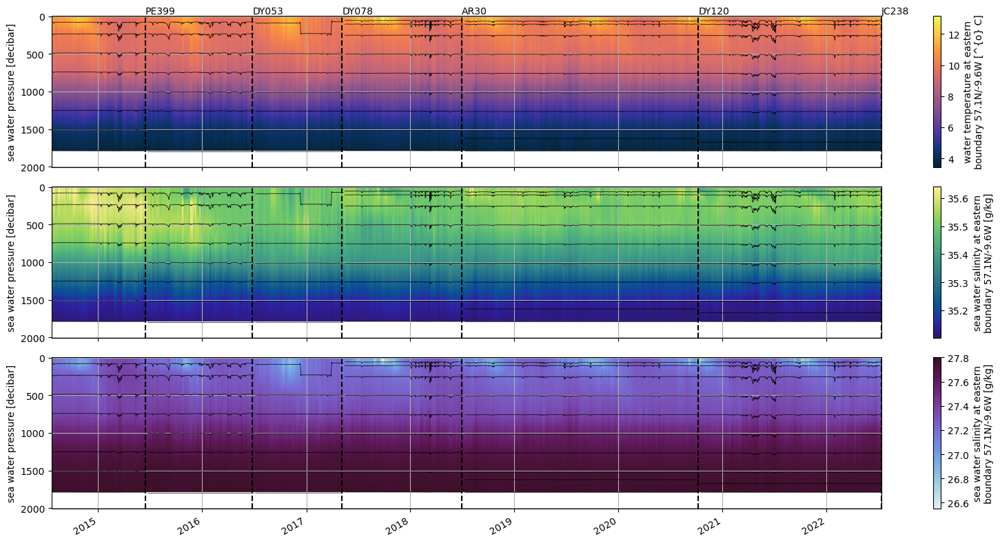

In [30]:
plot_moored_obs(ds_RT,'EB1','hydrography',ds_RT_stacked)

# WB1

# remove spurious values and upper extraploation hygrography

In [31]:
ds_RT['TG_WEST'] = repeat_upper_values(ds_RT['TG_WEST'])
ds_RT['SG_WEST'] = repeat_upper_values(ds_RT['SG_WEST'])

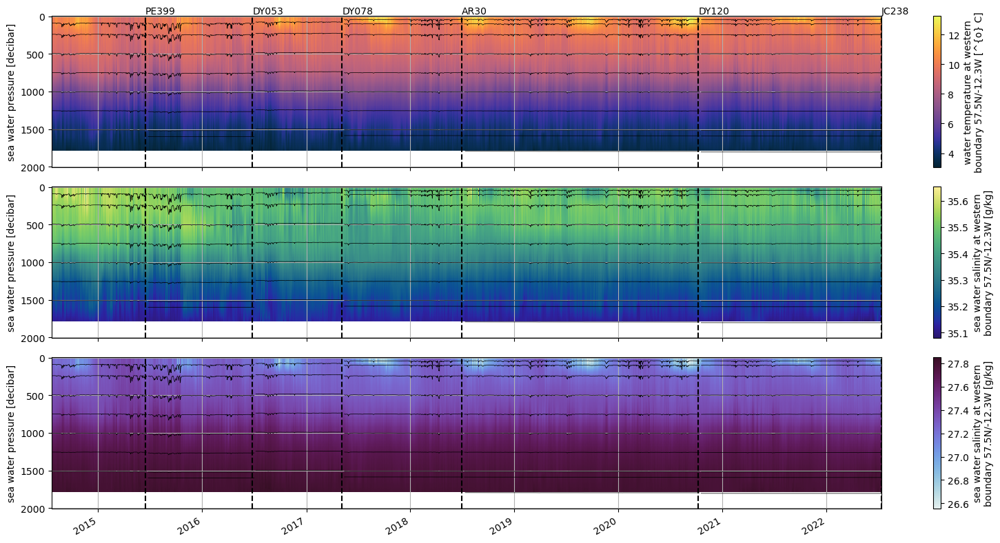

In [32]:
plot_moored_obs(ds_RT,'WB1','hydrography',ds_RT_stacked)

## linear extrapolation to surface

In [33]:
def linear_upper_values_WEST_1(var):
    var_i = var.interpolate_na(
        dim='PRES',
        method="linear",
        fill_value="extrapolate",
    )
    mask = var_i.where((var_i.PRES<=1580)).notnull()

    var_i = var_i.where(mask)
    

    var_i = var_i.where(mask)
    var_i = var_i.where(np.abs(var_i)<3.5*var_i.std(['TIME']))
    var_i = var_i.interpolate_na(
                dim='TIME',
                method="linear",
            ).where(mask)
    return var_i

ds_RT['V_WEST_1'] = linear_upper_values_WEST_1(ds_RT['V_WEST_1'])
ds_RT['U_WEST_1'] = linear_upper_values_WEST_1(ds_RT['U_WEST_1'])
ds_RT['W_WEST_1'] = linear_upper_values_WEST_1(ds_RT['W_WEST_1'])

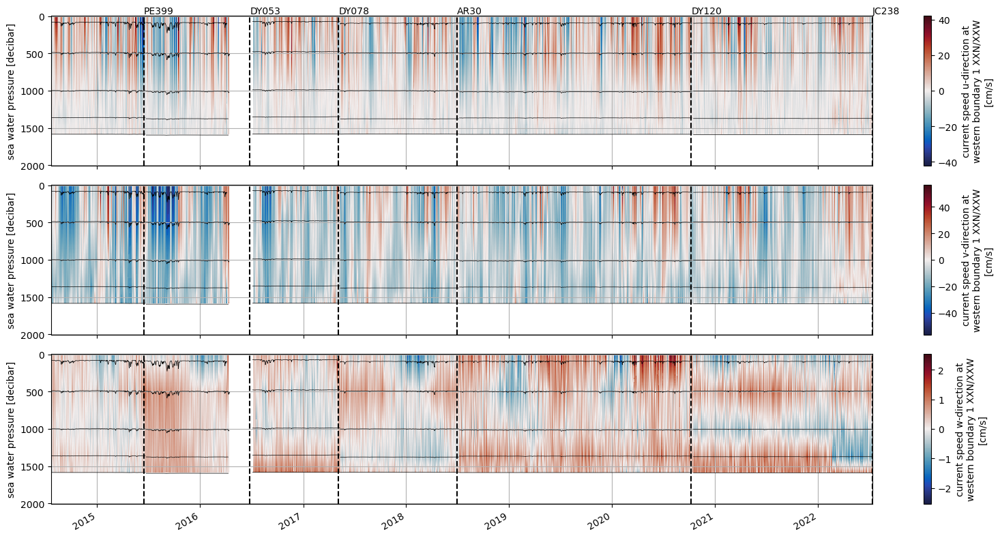

In [34]:
plot_moored_obs(ds_RT,'WB1','velocity',ds_RT_stacked)

# WB2
## linearly inter/extrapolate

In [35]:

def linear_upper_values_WEST_2(var):
    mask = (var.PRES<1800)&(var.PRES>1020)
    var_i = var.interpolate_na(dim='PRES',method='linear',fill_value='extrapolate')
    var_i = var_i.where(mask)
    mask = var_i.notnull()
    var_i = var_i.where(np.abs(var_i)<3.5*var_i.std(['TIME']))
    var_i = var_i.interpolate_na(
                dim='TIME',
                method="linear",
            ).where(mask)
    return var_i

ds_RT['V_WEST_2'] = linear_upper_values_WEST_2(ds_RT['V_WEST_2'])
ds_RT['U_WEST_2'] = linear_upper_values_WEST_2(ds_RT['U_WEST_2'])
ds_RT['W_WEST_2'] = linear_upper_values_WEST_2(ds_RT['W_WEST_2'])

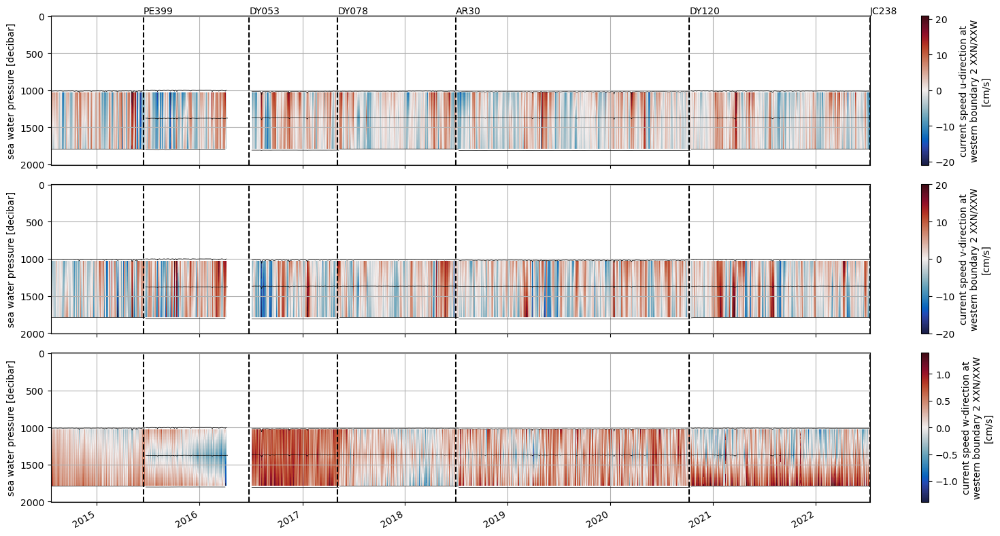

In [36]:
plot_moored_obs(ds_RT,'WB2','velocity',ds_RT_stacked)

# plot again all data

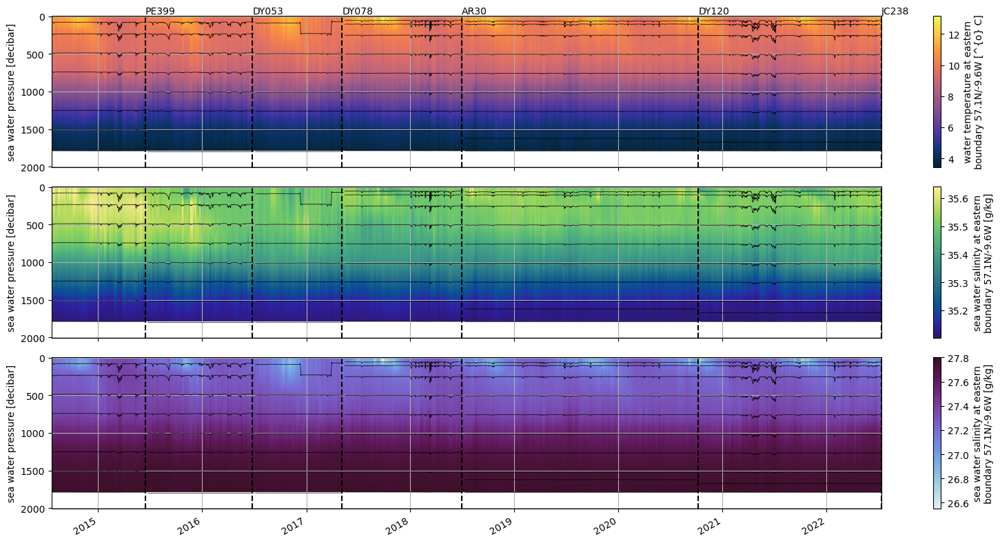

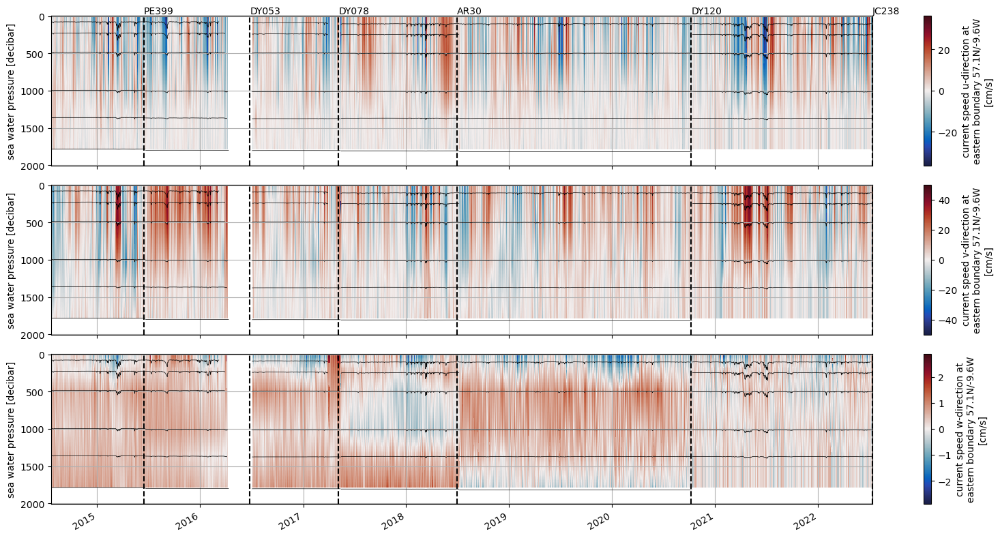

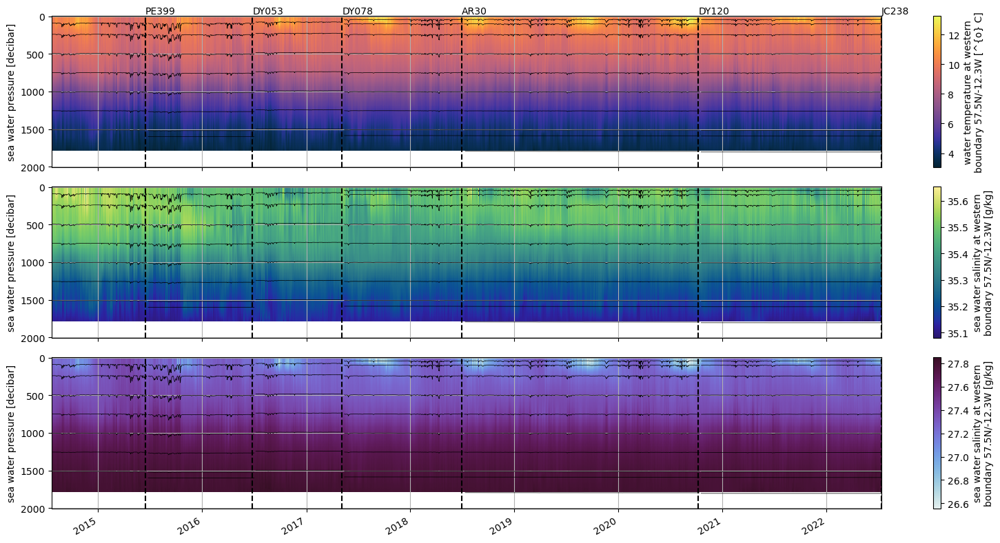

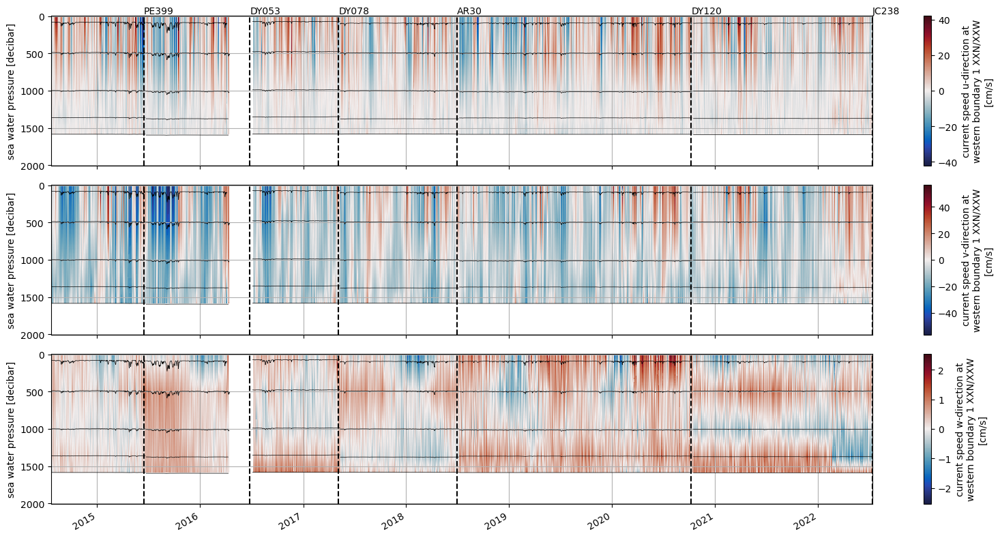

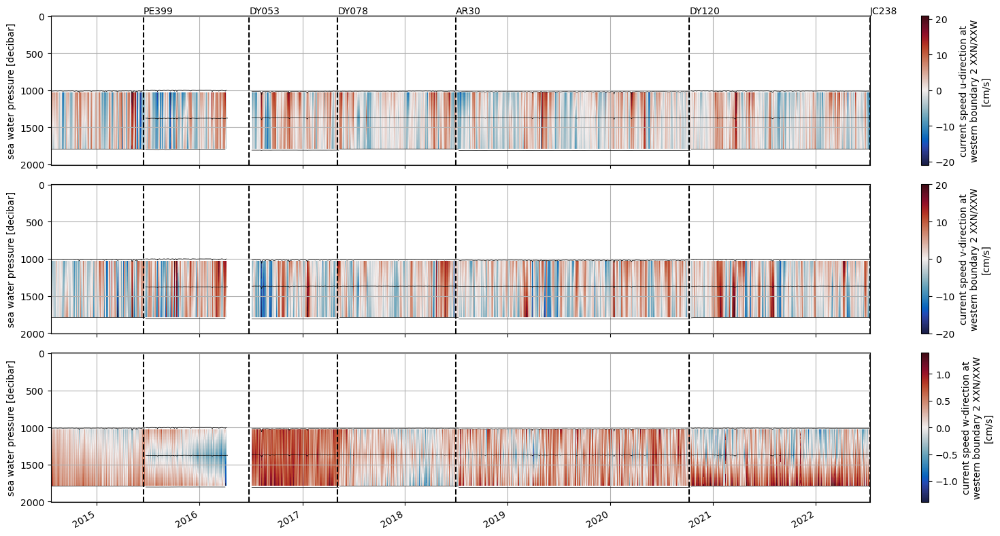

In [37]:
plot_moored_obs(ds_RT,'EB1','hydrography',ds_RT_stacked)
plot_moored_obs(ds_RT,'EB1','velocity',ds_RT_stacked)

plot_moored_obs(ds_RT,'WB1','hydrography',ds_RT_stacked)
plot_moored_obs(ds_RT,'WB1','velocity',ds_RT_stacked)

plot_moored_obs(ds_RT,'WB2','velocity',ds_RT_stacked)

In [38]:
ds_RT.attrs['title']='CLASS Rockall Trough mooring data Jul 2014 to Jul 2022'
ds_RT.attrs['history']=f'Delayed time processed quality controlled Surface extrapolation done with. Surface extrapolation done with {script_name}.ipynb'
ds_RT.attrs['id']='Rockall_Trough_mooring_gridded_TSUV_201407_202207_v0.1'
ds_RT.attrs['time_coverage_start'] = f'{ds_RT.TIME.min().values}'
ds_RT.attrs['time_coverage_end'] = f'{ds_RT.TIME.max().values}'
ds_RT.attrs['date_modified'] = datetime.datetime.now().strftime("%d-%m-%YT%H:%M:%SZ")
ds_RT.attrs['contributor_name'] = 'Kristin Burmeister'
ds_RT.attrs['contributor_email'] = 'Kristin.Burmeister@sams.ac.uk'
ds_RT.to_netcdf((data_out_path/file_name_out))

# Plot for paper

In [39]:
fs=14
font = {'weight' : 'normal',
        'size'   : fs}
plt.rc('font', **font)

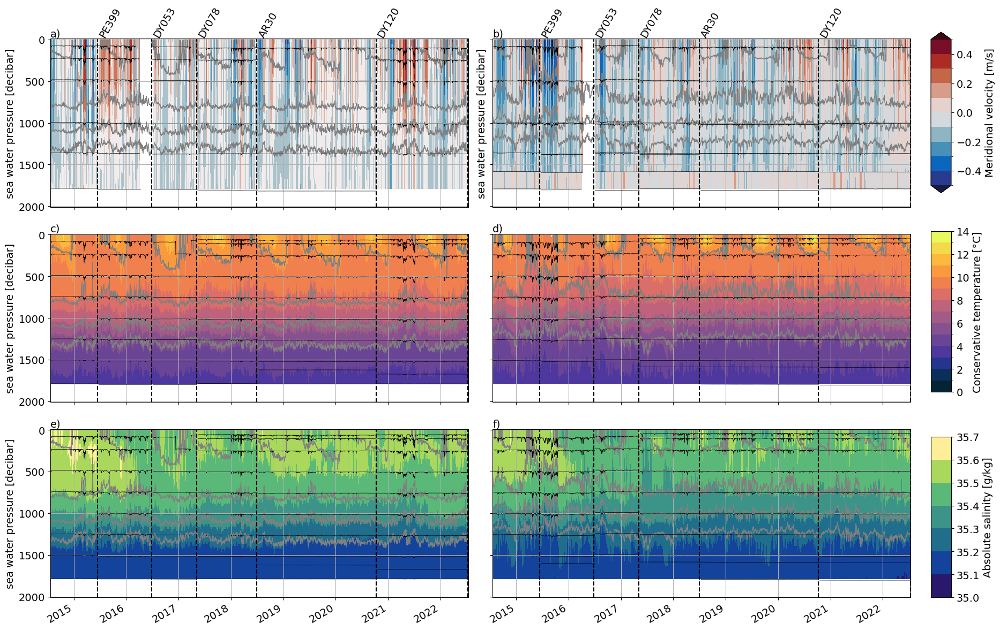

In [40]:
sig_lev = np.array([27.2,27.4,27.6,27.7])
vel_lev = np.arange(-.5,.55,.1)
tem_levs = np.arange(0,15,1)
sal_levs = np.arange(35,35.7,.1)
fig,axs = plt.subplots(3,2,figsize=[19,12],sharex=True,sharey=True)

# EB1
sigma = gsw.sigma0(ds_RT.SG_EAST, ds_RT.TG_EAST)
ax = axs[0,0]
imV = (ds_RT.V_EAST*1e-2).plot(ax=ax,x='TIME',yincrease=False,
                   levels=vel_lev,cmap=cm.cm.balance,
                   add_colorbar=False)
p=sigma.plot.contour(ax=ax,x='TIME',
                    levels=sig_lev,colors='grey',
                    yincrease=False,linewidths=1)
# plt.clabel(p,levels=sig_lev[::2],fmt='%3.1f',fontsize=fs)
ds_RT_stacked.PS_EAST_1_UV.plot.line('k',ax=ax,x='TIME',hue='ZS_EAST_1_UV',add_legend=False,lw=0.5)

ax = axs[1,0]
imT = ds_RT.TG_EAST.plot(ax=ax,x='TIME',yincrease=False,
                   levels=tem_levs,cmap=cm.cm.thermal,
                   add_colorbar=False)
p=sigma.plot.contour(ax=ax,x='TIME',
                    levels=sig_lev,colors='grey',
                    yincrease=False,linewidths=1)
# plt.clabel(p,levels=sig_lev[::2],fmt='%3.1f',fontsize=fs)
ds_RT_stacked.PS_EAST_TS.plot.line('k',ax=ax,x='TIME',hue='ZS_EAST_TS',add_legend=False,lw=0.5)

ax = axs[2,0]
imS= ds_RT.SG_EAST.plot(ax=ax,x='TIME',yincrease=False,
                    levels=sal_levs, cmap=cm.cm.haline,
                    add_colorbar=False)
p=sigma.plot.contour(ax=ax,x='TIME',
                    levels=sig_lev,colors='grey',
                    yincrease=False,linewidths=1)
# plt.clabel(p,levels=sig_lev[::2],fmt='%3.1f',fontsize=fs)
ds_RT_stacked.PS_EAST_TS.plot.line('k',ax=ax,x='TIME',hue='ZS_EAST_TS',add_legend=False,lw=0.5)

# WB1
sigma = gsw.sigma0(ds_RT.SG_WEST, ds_RT.TG_WEST)

# Create merged WB1/2 CM
ds_RT['v_RTWB'] = ds_RT.V_WEST_2.where(ds_RT.V_WEST_1.isnull())
ds_RT['v_mask'] = (ds_RT.v_RTWB.notnull()+ds_RT.V_WEST_1.notnull())
ds_RT['v_RTWB'] = (ds_RT.v_RTWB.fillna(0)+ds_RT.V_WEST_1.fillna(0)).where(ds_RT.v_mask==1)

# ds_RT['v_RTWB'] = ((ds_RT.V_WEST_1.where(
#     ds_RT.V_WEST_2.isnull()).fillna(0
#     )+ds_RT.V_WEST_2.fillna(0
#     )+ds_RT.V_WEST_2.where(
#     ds_RT.V_WEST_1.isnull()).fillna(0
#     )+ds_RT.V_WEST_1.fillna(0))/2).where(ds_RT.v_mask==1)

ax = axs[0,1]
imV = (ds_RT.v_RTWB*1e-2).plot(ax=ax,x='TIME',yincrease=False,
                   levels=vel_lev,cmap=cm.cm.balance,
                   add_colorbar=False)
p=sigma.plot.contour(ax=ax,x='TIME',
                    levels=sig_lev,colors='grey',
                    yincrease=False,linewidths=1)
# plt.clabel(p,levels=sig_lev[::2],fmt='%3.1f',fontsize=fs)
ds_RT_stacked.PS_WEST_1_UV.plot.line('k',ax=ax,x='TIME',hue='ZS_WEST_1_UV',add_legend=False,lw=0.5)
ds_RT_stacked.PS_WEST_2_UV.plot.line('k',ax=ax,x='TIME',hue='ZS_WEST_2_UV',add_legend=False,lw=0.5)

ax = axs[1,1]
ds_RT.TG_WEST.plot(ax=ax,x='TIME',yincrease=False,
                   levels=tem_levs,cmap=cm.cm.thermal,
                   add_colorbar=False)
p=sigma.plot.contour(ax=ax,x='TIME',
                    levels=sig_lev,colors='grey',
                    yincrease=False,linewidths=1)
# plt.clabel(p,levels=sig_lev[::2],fmt='%3.1f',fontsize=fs)
ds_RT_stacked.PS_WEST_TS.plot.line('k',ax=ax,x='TIME',hue='ZS_WEST_TS',add_legend=False,lw=0.5)

ax = axs[2,1]
ds_RT.SG_WEST.plot(ax=ax,x='TIME',yincrease=False,
                   levels=sal_levs,cmap=cm.cm.haline,
                   add_colorbar=False)
p=sigma.plot.contour(ax=ax,x='TIME',
                    levels=sig_lev,colors='grey',
                    yincrease=False,linewidths=1)
# plt.clabel(p,levels=sig_lev[::2],fmt='%3.1f',fontsize=fs)
ds_RT_stacked.PS_WEST_TS.plot.line('k',ax=ax,x='TIME',hue='ZS_WEST_TS',add_legend=False,lw=0.5)

    
for ax in axs[1:,1]:
    ax.set_ylabel('')

for i, label in enumerate(('a)', 'b)','c)','d)','e)','f)')):
    ax =  axs.flat[i]
    ax.text(0, 1., label, transform=ax.transAxes,
      fontsize=fs, ha='left',va='bottom')
    ax.vlines(ds_cruises.TIME,0, 1,transform=ax.get_xaxis_transform(),color='k',linestyle='--')
    ax.grid()
    if i<6:
        ax.set_xlabel('')

for i,text in enumerate(ds_cruises[:-2]):
    axs[0,0].annotate(text.values, xy=(ds_cruises[i].TIME,-5),va='bottom', rotation=60)
    axs[0,1].annotate(text.values, xy=(ds_cruises[i].TIME,-5),va='bottom', rotation=60)

plt.tight_layout()
fig.subplots_adjust(right=0.90)
cbar_ax = fig.add_axes([0.92, 0.69, 0.02, 0.25])
cb =fig.colorbar(imV, cax=cbar_ax)
cb.set_label('Meridional velocity [m/s]')

cbar_ax = fig.add_axes([0.92, 0.38, 0.02, 0.25])
cb =fig.colorbar(imT, cax=cbar_ax)
cb.set_label('Conservative temperature [°C]')
    
cbar_ax = fig.add_axes([0.92, 0.06, 0.02, 0.25])
cb =fig.colorbar(imS, cax=cbar_ax)
cb.set_label('Absolute salinity [g/kg]')


fig.savefig(fig_out_path/f'RT_EB_WB_gridded_timeseries_{date_str_start[:-2]}_{date_str_end[:-2]}.png',bbox_inches='tight')